In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics 

def create_and_save_as_table(df, table_name):
    spark_df = spark.createDataFrame(df)
    spark_df.write.format('csv').saveAsTable(table_name)
    
def get_table_as_pandas_df(table_name):
    return sqlContext.sql("select * from " + table_name + " tables").toPandas()

In [0]:
display(get_table_as_pandas_df("metrics_1015"))

city,week,metric,normalized_visits_by_total_visits
Milwaukee,2022-04-18,downtown,0.81142827843965
Milwaukee,2022-04-18,relative,1.031052882627014
Milwaukee,2022-04-18,metro,0.786989971234275
Milwaukee,2022-04-25,downtown,0.6705295305104285
Milwaukee,2022-04-25,relative,0.9131127154870023
Milwaukee,2022-04-25,metro,0.7343338003488499
Milwaukee,2022-05-02,downtown,0.7266434346781143
Milwaukee,2022-05-02,relative,0.8393381785868566
Milwaukee,2022-05-02,metro,0.8657338045810336
Milwaukee,2022-05-09,downtown,0.86476537848314


In [0]:
rfc_data = get_table_as_pandas_df("1015_all_model_features")
lq_clusters = get_table_as_pandas_df("lq_clusters_single_period_1015") 
rq_dwtn_clusters = get_table_as_pandas_df("rq_dwtn_clusters_0822") 
rq_city_clusters = get_table_as_pandas_df("rq_city_clusters_0822") 
rq_dwtn_clusters_period_1 = get_table_as_pandas_df("rq_dwtn_clusters_1015_period_1") 
rq_dwtn_clusters_period_2 = get_table_as_pandas_df("rq_dwtn_clusters_1015_period_2_") 

In [0]:
def get_weather(cityname):
    weather_lookup = json.loads(requests.get('http://api.worldweatheronline.com/premium/v1/weather.ashx?key=dc3dc812f3b74f8aa83224814222208&q='+cityname+'&fx=no&cc=no&mca=yes&format=json').text)
    jan_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][0]['avgMinTemp_F'])
    feb_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][1]['avgMinTemp_F'])
    dec_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][11]['avgMinTemp_F'])
    jan_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][0]['absMaxTemp_F'])
    feb_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][1]['absMaxTemp_F'])
    dec_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][11]['absMaxTemp_F'])
    winter_avg = (((jan_min+jan_max)/2) + ((feb_min+feb_max)/2) + ((dec_min+dec_max)/2))/3
    
    mar_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][2]['avgMinTemp_F'])
    apr_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][3]['avgMinTemp_F'])
    may_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][4]['avgMinTemp_F'])
    mar_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][2]['absMaxTemp_F'])
    apr_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][3]['absMaxTemp_F'])
    may_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][4]['absMaxTemp_F'])
    spring_avg = (((mar_min+mar_max)/2) + ((apr_min+apr_max)/2) + ((may_min+may_max)/2))/3
    
    jun_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][5]['avgMinTemp_F'])
    jul_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][6]['avgMinTemp_F'])
    aug_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][7]['avgMinTemp_F'])
    jun_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][5]['absMaxTemp_F'])
    jul_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][6]['absMaxTemp_F'])
    aug_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][7]['absMaxTemp_F'])
    summer_avg = (((jun_min+jun_max)/2) + ((jul_min+jul_max)/2) + ((aug_min+aug_max)/2))/3
        
    sep_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][8]['avgMinTemp_F'])
    oct_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][9]['avgMinTemp_F'])
    nov_min = float(weather_lookup['data']['ClimateAverages'][0]['month'][10]['avgMinTemp_F'])
    sep_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][8]['absMaxTemp_F'])
    oct_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][9]['absMaxTemp_F'])
    nov_max = float(weather_lookup['data']['ClimateAverages'][0]['month'][10]['absMaxTemp_F'])
    fall_avg = (((sep_min+sep_max)/2) + ((oct_min+oct_max)/2) + ((nov_min+nov_max)/2))/3
    
    return pd.Series([winter_avg,spring_avg,summer_avg,fall_avg])

In [0]:
rfc_data['display_name'] = rfc_data['city'].map({'Boston': "Boston, MA",
 'Portland': "Portland, OR",
 'Las Vegas': "Las Vegas, NV",
 'Detroit': "Detroit, MI",
 'New York': "New York, NY",
 'Los Angeles': "Los Angeles, CA",
 'Chicago': "Chicago, IL",
 'Houston': "Houston, TX",
 'Phoenix': "Phoenix, AZ",
 'Philadelphia': "Philadelphia, PA",
 'Vancouver': "Vancouver, BC",
 'Montreal': "Montreal, QC",
 'Calgary': "Calgary, AB",
 'Halifax': "Halifax, NS",
 'London': "London, ON",
 'Edmonton': "Edmonton, AB",
 'Mississauga': "Missisauga, ON",
 'Ottawa': "Ottawa, ON",
 'Winnipeg': "Winnipeg, MB",
 'Toronto': "Toronto, ON",
 'Quebec': "Quebec, QC",
 'Cleveland': "Cleveland, OH",
 'Honolulu': "Honolulu, HI",
 'Cincinnati': "Cincinnati, OH",
 'Pittsburgh': "Pittsburgh, PA",
 'Salt Lake City': "Salt Lake City, UT",
 'Fort Worth': "Forth Worth, TX",
 'Columbus': "Columbus, OH",
 'Indianapolis': "Indianapolis, IN",
 'Charlotte': "Charlotte, NC",
 'San Francisco': "San Francisco, CA",
 'Seattle': "Seattle, WA",
 'Denver': "Denver, CO",
 'Washington DC': "Washington DC",
 'Sacramento': "Sacramento, CA",
 'Kansas City': "Kansas City, MO",
 'Atlanta': "Atlanta, GA",
 'Omaha': "Omaha, NB",
 'Colorado Springs': "Colorado Springs, CO",
 'Raleigh': "Raleigh, NC",
 'Miami': "Miami, FL",
 'Memphis': "Memphis, TN",
 'St Louis': "St Louis, MO",
 'Orlando': "Orlando, FL",
 'San Antonio': "San Antonio, TX",
 'San Diego': "San Diego, CA",
 'Dallas': "Dallas, TX",
 'San Jose': "San Jose, CA",
 'Austin': "Austin, TX",
 'Jacksonville': "Jacksonville, FL",
 'Tulsa': "Tulsa, OK",
 'Bakersfield': "Bakersfield, CA",
 'Wichita': "Wichita, KS",
 'Tampa': "Tampa, FL",
 'New Orleans': "New Orleans, LA",
 'Nashville': "Nashville, TN",
 'Oklahoma City': "Oklahoma City, OK",
 'El Paso': "El Paso, TX",
 'Louisville': "Louisville, KY",
 'Baltimore': "Baltimore, MD",
 'Milwaukee': "Milwaukee, WI",
 'Albuquerque': "Albuquerque, NM",
 'Tucson': "Tucson, AZ",
 'Fresno': "Fresno, CA",
 'Oakland': "Oakland, CA",
 'Minneapolis':"Minneapolis, MN"})

import json
import requests
rfc_data[['winter_avg_temp','spring_avg_temp','summer_avg_temp','fall_avg_temp']] = rfc_data['display_name'].apply(lambda x: get_weather(x))

In [0]:
create_and_save_as_table(rfc_data.drop(columns=['display_name','Climate_Cold Desert', 'Climate_Cold Semi-Arid',
       'Climate_Cold Semi-Arid ', 'Climate_Hot Desert', 'Climate_Hot Desert ',
       'Climate_Hot Semi-Arid ', 'Climate_Hot-Summer Mediterranean',
       'Climate_Humid Continental Climate - Dry Warm Summer',
       'Climate_Humid Continental Hot Summers With Year Around Precipitation',
       'Climate_Humid Continental Mild Summer - Wet All Year',
       'Climate_Humid Subtropical', 'Climate_Tropical Monsoon ',
       'Climate_Tropical Savanna', 'Climate_Warm-Summer Mediterranean']), 'all_model_features_1015_weather')

--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-1001567843082312> in <module> 
 ----> 1 create_and_save_as_table(rfc_data.drop(columns=['display_name','Climate_Cold Desert', 'Climate_Cold Semi-Arid',
 2 'Climate_Cold Semi-Arid ' , 'Climate_Hot Desert' , 'Climate_Hot Desert ' , 
 3 'Climate_Hot Semi-Arid ' , 'Climate_Hot-Summer Mediterranean' , 
 4 'Climate_Humid Continental Climate - Dry Warm Summer' , 
 5 'Climate_Humid Continental Hot Summers With Year Around Precipitation' , 

 <command-118121327016600> in create_and_save_as_table (df, table_name) 
 12 def create_and_save_as_table ( df , table_name ) : 
 13 spark_df = spark . createDataFrame ( df ) 
 ---> 14 spark_df . write . format ( 'csv' ) . saveAsTable ( table_name ) 
 15 
 16 def get_table_as_pandas_df ( table_name ) : 

 /databricks/spark/python/pyspark/sql/readwriter.py in saveAsTable (self, name, format, mode, partitionBy, **options) 
 1183 if format is not None : 
 1184 self . format ( format ) 
 -> 1185 self . _jwrite . saveAsTable ( name ) 
 1186 
 1187 def json(self, path, mode=None, compression=None, dateFormat=None, timestampFormat=None,

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 121 # Hide where the exception came from that shows a non-Pythonic 
 122 # JVM exception message. 
 --> 123 raise converted from None 
 124 else : 
 125 raise 

 AnalysisException : Table `all_model_features_1015_weather` already exists.

In [0]:
rfc_data = get_table_as_pandas_df("all_model_features_1015_weather")

In [0]:
display(rfc_data)

city,total_pop_downtown,total_pop_city,pct_singlefam_downtown,pct_singlefam_city,pct_multifam_downtown,pct_multifam_city,pct_mobile_home_and_others_downtown,pct_mobile_home_and_others_city,pct_renter_downtown,pct_renter_city,median_age_downtown,median_age_city,bachelor_plus_downtown,bachelor_plus_city,median_hhinc_downtown,median_hhinc_city,median_rent_downtown,median_rent_city,pct_vacant_downtown,pct_vacant_city,pct_nhwhite_downtown,pct_nhwhite_city,pct_nhblack_downtown,pct_nhblack_city,pct_nhasian_downtown,pct_nhasian_city,pct_hisp_downtown,pct_hisp_city,pct_commute_auto_downtown,pct_commute_auto_city,pct_commute_public_transit_downtown,pct_commute_public_transit_city,pct_commute_bicycle_downtown,pct_commute_bicycle_city,pct_commute_walk_downtown,pct_commute_walk_city,pct_commute_others_downtown,pct_commute_others_city,housing_units_downtown,housing_units_city,average_commute_time_downtown,average_commute_time_city,pct_jobs_agriculture_forestry_fishing_hunting,pct_jobs_mining_quarrying_oil_gas,pct_jobs_utilities,pct_jobs_construction,pct_jobs_manufacturing,pct_jobs_wholesale_trade,pct_jobs_retail_trade,pct_jobs_transport_warehouse,pct_jobs_information,pct_jobs_finance_insurance,pct_jobs_real_estate,pct_jobs_professional_science_techical,pct_jobs_management_of_companies_enterprises,pct_jobs_administrative_support_waste,pct_jobs_educational_services,pct_jobs_healthcare_social_assistance,pct_jobs_arts_entertainment_recreation,pct_jobs_accomodation_food_services,pct_jobs_other,pct_jobs_public_administration,employment_entropy,population_density_downtown,population_density_city,employment_density_downtown,housing_density_downtown,housing_density_city,median_year_structure_built,median_no_rooms,%Liberal-Leaning,%Conservative-Leaning,%Other,days_school_closing,days_workplace_closing,days_cancel_large_events,days_cancel_all_events,days_stay_home_requirements,days_income_support,days_mask_mandates,winter_avg_temp,spring_avg_temp,summer_avg_temp,fall_avg_temp
Halifax,27888.0,405118.0,14.491298527443105,60.92915014652645,85.57563587684069,36.85858759983911,44.77911646586345,37.87565362293858,82.25751943224063,39.70672635445362,36.8431500808467,40.731404958677686,51.08359133126935,29.010732686714796,37395.013098544696,57501.84550712122,828.8463031170177,442.3932369829288,17.131782945736433,7.524432907051434,63.78105590062112,69.50604144493833,5.221273291925465,3.1265260126463406,21.21506211180124,8.421711638389782,0.07763975155279502,0.017529581168221373,31.356560415122313,77.71497263287125,15.789473684210526,11.770423039541665,2.7798369162342476,0.9412246150698245,48.739807264640476,8.097600900301806,1.3343217197924346,1.4757788122154523,14940.0,174030.0,23.569444444444443,28.035586369218173,0.19675356615838663,0.4426955238563699,0.24594195769798327,3.541564190850959,1.8199704869650764,2.1642892277422527,9.296606000983768,1.574028529267093,3.689129365469749,5.509099852434826,5.804230201672405,17.06837186424004,0.8362026561731432,3.984259714707329,1.7215937038858828,13.52680767338908,2.6561731431382194,11.264141662567633,10.772257747171668,3.8858829316281356,2.5773198719226516,0.010995175687821886,1.6434352094577698E-4,8.015344296235619E-4,0.0058902726899045825,7.059845020510954E-5,1974.3017851128327,4.1194779116465865,87.86%,8.61%,3.54%,375,175,214,736,40,667,700,31.71666666666667,41.88333333333333,64.55,53.81666666666666
London,34468.0,394162.0,27.727272727272727,66.8812889314806,72.19696969696969,33.082774317201725,41.64141414141414,28.878174413033065,69.79560938682816,39.19262650746626,41.480376000928395,41.12275042444821,32.23085827683148,25.186130937730738,36145.7414391399,56758.26784761915,657.3683681630542,426.5497735324259,16.328857360020265,6.984475231646471,77.46628277011668,70.3838087518174,2.106379754508259,2.575880392686661,8.6225185634187,14.501872080904773,0.030307622367025305,0.0771992125680318,60.4989604989605,82.9958140061093,14.90941490941491,8.946147754270845,2.4057024057024057,1.173775313949542,21.205821205821206,5

In [0]:
downtown_rfc_table = rfc_data[['city','total_pop_downtown', 'pct_singlefam_downtown', 'pct_multifam_downtown','pct_renter_downtown','median_age_downtown','bachelor_plus_downtown','median_hhinc_downtown','median_rent_downtown','pct_vacant_downtown','median_year_structure_built','median_no_rooms','pct_commute_auto_city','pct_commute_public_transit_city','pct_commute_bicycle_city','pct_commute_walk_city','housing_units_downtown','average_commute_time_city','pct_jobs_agriculture_forestry_fishing_hunting','pct_jobs_mining_quarrying_oil_gas', 'pct_jobs_utilities','pct_jobs_construction', 'pct_jobs_manufacturing','pct_jobs_wholesale_trade', 'pct_jobs_retail_trade','pct_jobs_transport_warehouse', 'pct_jobs_information','pct_jobs_finance_insurance','pct_jobs_real_estate','pct_jobs_professional_science_techical','pct_jobs_management_of_companies_enterprises','pct_jobs_administrative_support_waste','pct_jobs_educational_services','pct_jobs_healthcare_social_assistance','pct_jobs_arts_entertainment_recreation','pct_jobs_accomodation_food_services','pct_jobs_public_administration', 'employment_entropy', 'population_density_downtown', 'employment_density_downtown', 'housing_density_downtown','days_school_closing', 'days_workplace_closing','days_cancel_large_events', 'days_cancel_all_events','days_stay_home_requirements', 'days_income_support','days_mask_mandates', 'winter_avg_temp', 'summer_avg_temp']]

#'pct_nhwhite_downtown','pct_nhblack_downtown','pct_nhasian_downtown','pct_hisp_downtown',

city_rfc_table = rfc_data[['city','total_pop_city', 'pct_singlefam_city', 'pct_multifam_city','pct_renter_city','median_age_city','bachelor_plus_city','median_hhinc_city','median_rent_city','pct_vacant_city','pct_commute_auto_city','pct_commute_public_transit_city','pct_commute_bicycle_city','pct_commute_walk_city','housing_units_city','average_commute_time_city','pct_jobs_agriculture_forestry_fishing_hunting','pct_jobs_mining_quarrying_oil_gas', 'pct_jobs_utilities','pct_jobs_construction', 'pct_jobs_manufacturing','pct_jobs_wholesale_trade', 'pct_jobs_retail_trade','pct_jobs_transport_warehouse', 'pct_jobs_information','pct_jobs_finance_insurance','pct_jobs_real_estate','pct_jobs_professional_science_techical','pct_jobs_management_of_companies_enterprises','pct_jobs_administrative_support_waste','pct_jobs_educational_services','pct_jobs_healthcare_social_assistance','pct_jobs_arts_entertainment_recreation','pct_jobs_accomodation_food_services','pct_jobs_public_administration', 'employment_entropy', 'population_density_city', 'employment_density_downtown', 'housing_density_city', 'days_school_closing', 'days_workplace_closing','days_cancel_large_events', 'days_cancel_all_events','days_stay_home_requirements', 'days_income_support','days_mask_mandates', 'winter_avg_temp', 'summer_avg_temp']]

#'pct_nhwhite_city','pct_nhblack_city','pct_nhasian_city','pct_hisp_city',

lq_rfc_table = rfc_data[['city','total_pop_downtown', 'pct_singlefam_downtown', 'pct_multifam_downtown','pct_renter_downtown','median_age_downtown','bachelor_plus_downtown','median_hhinc_downtown','median_rent_downtown','pct_vacant_downtown','median_year_structure_built','median_no_rooms','pct_commute_auto_city','pct_commute_public_transit_city','pct_commute_bicycle_city','pct_commute_walk_city','housing_units_downtown','average_commute_time_city','pct_jobs_agriculture_forestry_fishing_hunting','pct_jobs_mining_quarrying_oil_gas', 'pct_jobs_utilities','pct_jobs_construction', 'pct_jobs_manufacturing','pct_jobs_wholesale_trade', 'pct_jobs_retail_trade','pct_jobs_transport_warehouse', 'pct_jobs_information','pct_jobs_finance_insurance','pct_jobs_real_estate','pct_jobs_professional_science_techical','pct_jobs_management_of_companies_enterprises','pct_jobs_administrative_support_waste','pct_jobs_educational_services','pct_jobs_healthcare_social_assistance','pct_jobs_arts_entertainment_recreation','pct_jobs_accomodation_food_services','pct_jobs_public_administration', 'employment_entropy', 'population_density_downtown', 'employment_density_downtown', 'housing_density_downtown','days_school_closing', 'days_workplace_closing','days_cancel_large_events', 'days_cancel_all_events','days_stay_home_requirements', 'days_income_support','days_mask_mandates', 'winter_avg_temp', 'summer_avg_temp']]

#lq_rfc_table = rfc_data[['city', 'total_pop_downtown', 'total_pop_city','pct_singlefam_downtown', 'pct_singlefam_city', 'pct_multifam_downtown','pct_multifam_city','pct_mobile_home_and_others_city', 'pct_renter_downtown','pct_renter_city', 'median_age_downtown', 'median_age_city','bachelor_plus_downtown', 'bachelor_plus_city', 'median_hhinc_downtown','median_hhinc_city', 'median_rent_downtown', 'median_rent_city','pct_vacant_downtown', 'pct_vacant_city', 'pct_commute_auto_downtown', 'pct_commute_auto_city','pct_commute_public_transit_downtown','pct_commute_public_transit_city', 'pct_commute_bicycle_downtown','pct_commute_bicycle_city', 'pct_commute_walk_downtown','pct_commute_walk_city','pct_commute_others_city', 'housing_units_downtown','housing_units_city', 'average_commute_time_downtown','average_commute_time_city','pct_jobs_agriculture_forestry_fishing_hunting','pct_jobs_mining_quarrying_oil_gas', 'pct_jobs_utilities','pct_jobs_construction', 'pct_jobs_manufacturing','pct_jobs_wholesale_trade', 'pct_jobs_retail_trade','pct_jobs_transport_warehouse', 'pct_jobs_information','pct_jobs_finance_insurance', 'pct_jobs_real_estate','pct_jobs_professional_science_techical','pct_jobs_management_of_companies_enterprises','pct_jobs_administrative_support_waste','pct_jobs_educational_services','pct_jobs_healthcare_social_assistance','pct_jobs_arts_entertainment_recreation','pct_jobs_accomodation_food_services','pct_jobs_public_administration', 'employment_entropy','population_density_downtown', 'population_density_city','employment_density_downtown', 'housing_density_downtown','housing_density_city', 'days_school_closing', 'days_workplace_closing','days_cancel_large_events', 'days_cancel_all_events','days_stay_home_requirements', 'days_income_support','days_mask_mandates', 'winter_avg_temp', 'summer_avg_temp']]

#'pct_nhwhite_downtown','pct_nhwhite_city', 'pct_nhblack_downtown', 'pct_nhblack_city','pct_nhasian_downtown', 'pct_nhasian_city', 'pct_hisp_downtown','pct_hisp_city', 

#lq_rfc_table['population_lq'] = lq_rfc_table['total_pop_downtown']/lq_rfc_table['total_pop_city']

In [0]:
rq_dwtn_clusters = rq_dwtn_clusters.replace('Québec','Quebec')
rq_dwtn_clusters = rq_dwtn_clusters.replace('Montréal','Montreal')
downtown_rfc_table = downtown_rfc_table[~downtown_rfc_table['city'].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])]
downtown_rfc_table.loc[:,'cluster'] = downtown_rfc_table.loc[:,'city'].map(dict(zip(rq_dwtn_clusters['city'], rq_dwtn_clusters['cluster'])))

In [0]:
rq_city_clusters = rq_city_clusters.replace('Québec','Quebec')
rq_city_clusters = rq_city_clusters.replace('Montréal','Montreal')
city_rfc_table = city_rfc_table[~city_rfc_table['city'].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])]
city_rfc_table.loc[:,'cluster'] = city_rfc_table.loc[:,'city'].map(dict(zip(rq_city_clusters['city'], rq_city_clusters['cluster'])))

In [0]:
lq_clusters = lq_clusters.replace('Québec','Quebec')
lq_clusters = lq_clusters.replace('Montréal','Montreal')
lq_clusters['cluster_map'] = lq_clusters['cluster'].map({0:"L1",1:"L3",2:"L2",3:"L4",4:"L1",5:"L1"})
lq_rfc_table = lq_rfc_table[~lq_rfc_table['city'].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])].copy()
lq_rfc_table.loc[:,'cluster'] = lq_rfc_table.loc[:,'city'].map(dict(zip(lq_clusters['city'], lq_clusters['cluster_map'])))

In [0]:
rq_dwtn_clusters_period_1 = rq_dwtn_clusters_period_1.replace('Québec','Quebec')
rq_dwtn_clusters_period_1 = rq_dwtn_clusters_period_1.replace('Montréal','Montreal')
rq_dwtn_clusters_period_1['cluster_map'] = rq_dwtn_clusters_period_1['cluster'].map({0:"R1.1",1:"R1.5",2:"R1.3",3:"R1.4",4:"R1.2",5:"R1.1"})
downtown_rfc_table = downtown_rfc_table[~downtown_rfc_table['city'].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])]
downtown_rfc_table.loc[:,'cluster_period_1'] = downtown_rfc_table.loc[:,'city'].map(dict(zip(rq_dwtn_clusters_period_1['city'], rq_dwtn_clusters_period_1['cluster_map'])))

In [0]:
rq_dwtn_clusters_period_2 = rq_dwtn_clusters_period_2.replace('Québec','Quebec')
rq_dwtn_clusters_period_2 = rq_dwtn_clusters_period_2.replace('Montréal','Montreal')
rq_dwtn_clusters_period_2['cluster_map'] = rq_dwtn_clusters_period_2['cluster'].map({0:"R2.5",1:"R2.1",2:"R2.3",3:"R2.1",4:"R2.4",5:"R2.2"})
downtown_rfc_table = downtown_rfc_table[~downtown_rfc_table['city'].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])]
downtown_rfc_table.loc[:,'cluster_period_2'] = downtown_rfc_table.loc[:,'city'].map(dict(zip(rq_dwtn_clusters_period_2['city'], rq_dwtn_clusters_period_2['cluster_map'])))

In [0]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

X = downtown_rfc_table.drop(columns=['city','cluster','cluster_period_1','cluster_period_2']).to_numpy()
y = downtown_rfc_table['cluster_period_2'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
rf_random.fit(X_train, y_train)
rf_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits

In [0]:
def generate_random_forest_classifier(X, y, indextable):
    sc = StandardScaler()
    X = sc.fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001)
    model = RandomForestClassifier(n_estimators = 2000,
                                   min_samples_split = 5,
                                   min_samples_leaf = 1,
                                   max_features = 'sqrt',
                                   max_depth = 10,
                                   bootstrap = True) 
    model.fit(X_train, y_train)
    train_score = model.score(X_train, y_train)
    test_score = model.score(X_test, y_test)
    #feature_importances = pd.Series(model.feature_importances_, index = indextable.drop(columns=['city','cluster','cluster_period_1','cluster_period_2']).columns).sort_values(ascending = False)
    feature_importances = pd.Series(model.feature_importances_, index = indextable.drop(columns=['city','cluster']).columns).sort_values(ascending = False) #,'cluster_period_1','cluster_period_2'
    return feature_importances, train_score, test_score

In [0]:
#Generate RFC Downtown
X_dwtn = downtown_rfc_table.drop(columns=['city','cluster','cluster_period_1','cluster_period_2']).to_numpy()
y_dwtn = downtown_rfc_table['cluster'].to_numpy()
feature_importances, train_score, test_score = generate_random_forest_classifier(X_dwtn,y_dwtn, downtown_rfc_table)
print('train score: '+str(train_score))
print('test score: '+str(test_score))
feature_importances[0:60]

train score: 0.9591836734693877
test score: 0.23076923076923078
Out[108]: pct_jobs_information 0.059969
pct_commute_public_transit_city 0.052673
pct_jobs_professional_science_techical 0.047449
pct_jobs_real_estate 0.038029
pct_jobs_accomodation_food_services 0.035572
median_hhinc_downtown 0.033070
employment_density_downtown 0.032795
winter_avg_temp 0.031731
pct_jobs_public_administration 0.028333
pct_singlefam_downtown 0.027205
pct_commute_auto_city 0.025426
pct_renter_downtown 0.025285
average_commute_time_city 0.025231
pct_commute_bicycle_city 0.025033
days_stay_home_requirements 0.024729
pct_jobs_management_of_companies_enterprises 0.024652
pct_jobs_agriculture_forestry_fishing_hunting 0.023119
housing_units_downtown 0.022659
summer_avg_temp 0.022314
pct_jobs_arts_entertainment_recreation 0.022116
days_mask_mandates 0.021394
pct_jobs_wholesale_trade 0.021325
days_school_closing 0.021189
housing_density_downtown 0.020791
pct_jobs_retail_trade 0.019335
pct_jobs_manufacturing 0.019318
days_cancel_all_events 0.018066
bachelor_plus_downtown 0.017569
pct_jobs_mining_quarrying_oil_gas 0.017237
pct_commute_walk_city 0.017196
total_pop_downtown 0.016753
employment_entropy 0.015889
pct_multifam_downtown 0.015145
days_income_support 0.015127
pct_jobs_educational_services 0.013934
pct_jobs_healthcare_social_assistance 0.013350
pct_jobs_administrative_support_waste 0.013077
pct_jobs_transport_warehouse 0.013053
days_workplace_closing 0.012636
median_rent_downtown 0.011312
population_density_downtown 0.010376
pct_vacant_downtown 0.006463
pct_jobs_construction 0.005399
pct_jobs_finance_insurance 0.005217
days_cancel_large_events 0.004725
median_age_downtown 0.003493
pct_jobs_utilities 0.003241
dtype: float64

In [0]:
#Generate RFC City
X_city = city_rfc_table.drop(columns=['city','cluster']).to_numpy()
y_city = city_rfc_table['cluster'].to_numpy()
feature_importances, train_score = generate_random_forest_classifier(X_city,y_city, city_rfc_table)
print('train score: '+str(train_score))
feature_importances[0:60]

--------------------------------------------------------------------------- 
 KeyError Traceback (most recent call last)
 <command-732092476809938> in <module> 
 2 X_city = city_rfc_table . drop ( columns = [ 'city' , 'cluster' ] ) . to_numpy ( ) 
 3 y_city = city_rfc_table [ 'cluster' ] . to_numpy ( ) 
 ----> 4 feature_importances , train_score = generate_random_forest_classifier ( X_city , y_city , city_rfc_table ) 
 5 print ( 'train score: ' + str ( train_score ) ) 
 6 feature_importances [ 0 : 60 ] 

 <command-732092476809918> in generate_random_forest_classifier (X, y, indextable) 
 6 model . fit ( X_train , y_train ) 
 7 train_score = model . score ( X_train , y_train ) 
 ----> 8 feature_importances = pd . Series ( model . feature_importances_ , index = indextable . drop ( columns = [ 'city' , 'cluster' , 'cluster_period_1' , 'cluster_period_2' ] ) . columns ) . sort_values ( ascending = False ) 
 9 return feature_importances , train_score

 /databricks/python/lib/python3.8/site-packages/pandas/core/frame.py in drop (self, labels, axis, index, columns, level, inplace, errors) 
 4306 weight 1.0 0.8 
 4307 """
 -> 4308 return super().drop(
 4309 labels = labels , 
 4310 axis = axis , 

 /databricks/python/lib/python3.8/site-packages/pandas/core/generic.py in drop (self, labels, axis, index, columns, level, inplace, errors) 
 4151 for axis , labels in axes . items ( ) : 
 4152 if labels is not None : 
 -> 4153 obj = obj . _drop_axis ( labels , axis , level = level , errors = errors ) 
 4154 
 4155 if inplace : 

 /databricks/python/lib/python3.8/site-packages/pandas/core/generic.py in _drop_axis (self, labels, axis, level, errors) 
 4186 new_axis = axis . drop ( labels , level = level , errors = errors ) 
 4187 else : 
 -> 4188 new_axis = axis . drop ( labels , errors = errors ) 
 4189 result = self . reindex ( ** { axis_name : new_axis } ) 
 4190 

 /databricks/python/lib/python3.8/site-packages/pandas/core/indexes/base.py in drop (self, labels, errors) 
 5589 if mask . any ( ) : 
 5590 if errors != "ignore" : 
 -> 5591 raise KeyError ( f"{labels[mask]} not found in axis" ) 
 5592 indexer = indexer [ ~ mask ] 
 5593 return self . delete ( indexer ) 

 KeyError : "['cluster_period_1' 'cluster_period_2'] not found in axis"

In [0]:
#Generate RFC LQ
X_lq = lq_rfc_table.drop(columns=['city','cluster']).to_numpy()
y_lq = lq_rfc_table['cluster'].to_numpy()
feature_importances, train_score, test_score = generate_random_forest_classifier(X_lq,y_lq, lq_rfc_table)
print('train score: '+str(train_score))
feature_importances[0:60]

train score: 1.0
Out[92]: winter_avg_temp 0.051834
pct_jobs_professional_science_techical 0.050158
median_hhinc_downtown 0.046849
average_commute_time_city 0.035832
bachelor_plus_downtown 0.035085
pct_jobs_information 0.032527
employment_density_downtown 0.032364
median_rent_downtown 0.032032
pct_jobs_manufacturing 0.029353
pct_jobs_educational_services 0.027358
pct_jobs_retail_trade 0.024736
total_pop_downtown 0.023575
pct_jobs_utilities 0.021371
pct_renter_downtown 0.020288
summer_avg_temp 0.019961
pct_jobs_accomodation_food_services 0.019926
pct_jobs_transport_warehouse 0.019207
pct_jobs_finance_insurance 0.018978
pct_jobs_management_of_companies_enterprises 0.018854
pct_jobs_construction 0.018341
pct_jobs_public_administration 0.018335
pct_multifam_downtown 0.018254
days_workplace_closing 0.017992
pct_commute_public_transit_city 0.017802
housing_units_downtown 0.017130
days_stay_home_requirements 0.016682
days_mask_mandates 0.016444
pct_commute_auto_city 0.016311
pct_vacant_downtown 0.016017
pct_singlefam_downtown 0.015688
pct_commute_walk_city 0.015651
pct_jobs_healthcare_social_assistance 0.015633
pct_jobs_real_estate 0.015552
pct_jobs_administrative_support_waste 0.015314
pct_jobs_mining_quarrying_oil_gas 0.015038
median_age_downtown 0.014940
median_year_structure_built 0.014617
pct_commute_bicycle_city 0.014251
pct_jobs_arts_entertainment_recreation 0.013207
days_income_support 0.013054
employment_entropy 0.012905
days_cancel_large_events 0.012413
days_cancel_all_events 0.012390
pct_jobs_agriculture_forestry_fishing_hunting 0.011866
housing_density_downtown 0.011727
pct_jobs_wholesale_trade 0.011094
days_school_closing 0.011082
median_no_rooms 0.010305
population_density_downtown 0.009676
dtype: float64

In [0]:
#Generate RFC Downtown Period 1 Jun 20 - May 21
X_dwtn = downtown_rfc_table.drop(columns=['city','cluster','cluster_period_1','cluster_period_2','pct_singlefam_downtown']).to_numpy()
y_dwtn = downtown_rfc_table['cluster_period_1'].to_numpy()
feature_importances, train_score, test_score = generate_random_forest_classifier(X_dwtn,y_dwtn, downtown_rfc_table.drop(columns=['pct_singlefam_downtown']))
print('train score: '+str(train_score))
print('test score: '+str(test_score))
display(pd.DataFrame(feature_importances.reset_index()))

train score: 1.0
test score: 0.0

index,0
pct_jobs_information,0.051929792972869114
pct_jobs_professional_science_techical,0.03864109649696109
pct_renter_downtown,0.035765050062051204
pct_multifam_downtown,0.03403080605331063
pct_jobs_construction,0.03263455040918323
pct_commute_public_transit_city,0.030901532228570235
pct_commute_auto_city,0.028249126164096694
pct_commute_bicycle_city,0.027100648188248994
days_stay_home_requirements,0.027042594791711113
employment_entropy,0.026656399844328042


In [0]:
#Generate RFC Downtown Period 2 Jun 21 - May 22
X_dwtn = downtown_rfc_table.drop(columns=['city','cluster','cluster_period_1','cluster_period_2','pct_singlefam_downtown']).to_numpy()
y_dwtn = downtown_rfc_table['cluster_period_2'].to_numpy()
feature_importances, train_score, test_score = generate_random_forest_classifier(X_dwtn,y_dwtn, downtown_rfc_table.drop(columns=['pct_singlefam_downtown']))
print('train score: '+str(train_score))
print('test score: '+str(test_score))
display(pd.DataFrame(feature_importances.reset_index()))

train score: 1.0
test score: 0.0

index,0
pct_jobs_professional_science_techical,0.06285420278595721
winter_avg_temp,0.03417105768594197
summer_avg_temp,0.03360473996719757
pct_jobs_information,0.0332854667710977
pct_commute_public_transit_city,0.03272297145886377
pct_multifam_downtown,0.032002508192170466
pct_jobs_public_administration,0.0314491715535615
pct_commute_auto_city,0.031141421227378372
employment_density_downtown,0.030225422504277465
population_density_downtown,0.02635445986630973


In [0]:
#Generate RFC LQ
X_dwtn = lq_rfc_table.drop(columns=['city','cluster','pct_singlefam_downtown']).to_numpy()
y_dwtn = lq_rfc_table['cluster'].to_numpy()
feature_importances, train_score, test_score = generate_random_forest_classifier(X_dwtn,y_dwtn, lq_rfc_table.drop(columns=['pct_singlefam_downtown']))
print('train score: '+str(train_score))
print('test score: '+str(test_score))
display(pd.DataFrame(feature_importances.reset_index()))

train score: 0.8360655737704918
test score: 0.0

index,0
pct_jobs_information,0.05789832155444149
pct_jobs_retail_trade,0.047197733695778885
median_age_downtown,0.04460812301932284
pct_commute_bicycle_city,0.04241277794517353
employment_density_downtown,0.03674606415211949
pct_multifam_downtown,0.0363022288014272
pct_commute_auto_city,0.03435266022004485
median_hhinc_downtown,0.03206446060034548
pct_jobs_public_administration,0.03142717942275987
days_cancel_large_events,0.028381730433932238


In [0]:
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df')

In [0]:
normalized_visits_chronicle = normalized_visits[normalized_visits['metric']=='downtown'][['city','normalized_visits_by_total_visits','week']]
normalized_visits_chronicle = normalized_visits_chronicle[normalized_visits_chronicle['normalized_visits_by_total_visits'].notna()]
normalized_visits_chronicle['city'] = normalized_visits_chronicle['city'].replace('Québec','Quebec')
normalized_visits_chronicle = normalized_visits_chronicle[normalized_visits_chronicle['city'].isin(['Calgary','Quebec','San Francisco','Los Angeles','San Jose','Seattle','New York','Washington DC','Salt Lake City','Atlanta','Cleveland'])]
display(normalized_visits_chronicle.sort_values(['city','week']).reset_index(drop='True'))

city,normalized_visits_by_total_visits,week
Atlanta,0.66,2020-02-24
Atlanta,0.84,2020-03-02
Atlanta,0.7,2020-03-09
Atlanta,0.32,2020-03-16
Atlanta,0.27,2020-03-23
Atlanta,0.22,2020-03-30
Atlanta,0.16,2020-04-06
Atlanta,0.19,2020-04-13
Atlanta,0.22,2020-04-20
Atlanta,0.26,2020-04-27


In [0]:
normalized_visits_chronicle['week'].value_counts()

Out[9]: 2021-01-04 22
2022-02-21 16
2022-01-31 16
2022-02-07 16
2022-02-14 16
 ..
2020-03-02 11
2020-03-09 11
2022-04-25 11
2021-07-05 11
2022-06-13 2
Name: week, Length: 121, dtype: int64

In [0]:
normalized_visits_by_state_scalingnormalized_visits[normalized_visits['metric']=='downtown']['normalized_visits_by_state_scaling'].isna().sum()

Out[11]: 132

In [0]:
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df')[['city','metric','normalized_visits_by_total_visits','week']].replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits["city"].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])].copy()
normalized_visits_city = normalized_visits[normalized_visits["metric"]=="metro"].copy()
normalized_visits_city['cluster'] = normalized_visits_city['city'].map(dict(zip(rq_city_clusters['city'], rq_city_clusters['cluster']))).astype(int)

In [0]:
city_rfc_table = city_rfc_table[~city_rfc_table['city'].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])]
city_rfc_table.loc[:,'cluster'] = city_rfc_table.loc[:,'city'].map(dict(zip(rq_city_clusters['city'], rq_city_clusters['cluster'])))

In [0]:
mean_city = normalized_visits_city.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()

In [0]:
max_city = normalized_visits_city.groupby(['cluster','week']).max()['normalized_visits_by_total_visits'].reset_index()

In [0]:
min_city = normalized_visits_city.groupby(['cluster','week']).min()['normalized_visits_by_total_visits'].reset_index()

In [0]:
mean_city["week"] = pd.to_datetime(mean_city["week"])

In [0]:
mean_city_rolling = pd.DataFrame()
for i in mean_city["cluster"].unique():
    mean_city_rolling_cluster = mean_city[mean_city["cluster"]==i].copy()
    mean_city_rolling_cluster['rolling'] = mean_city_rolling_cluster['normalized_visits_by_total_visits'].rolling(window=9).mean().shift(-4)
    mean_city_rolling = pd.concat([mean_city_rolling,mean_city_rolling_cluster])

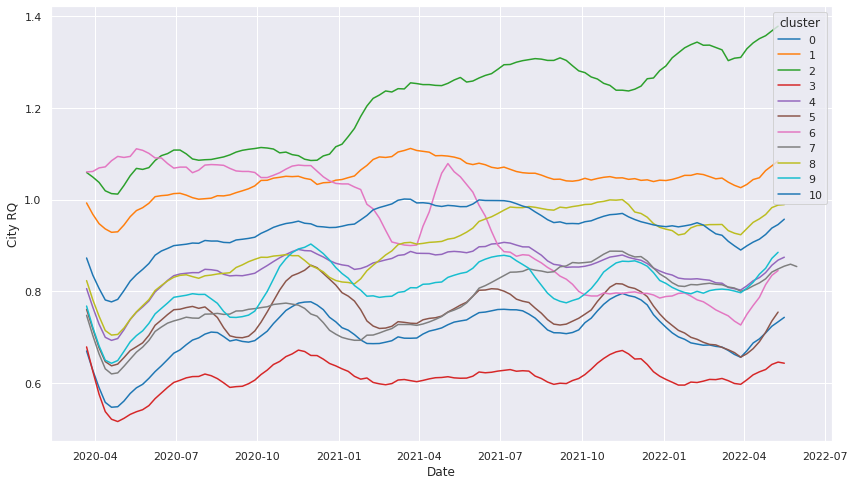

In [0]:
import seaborn as sns
#sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(14,8)})
ax = sns.lineplot(data=mean_city_rolling, x ='week', y = 'rolling', hue='cluster', palette='tab10')
plt.ylabel('City RQ')
plt.xlabel('Date')
plt.show()

In [0]:
import datetime
import seaborn as sns
datetime.date(2020, 6, 1)

Out[68]: datetime.date(2020, 6, 1)

In [0]:
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(rq_dwtn_clusters['city'], rq_dwtn_clusters['cluster']))).astype(int)
#mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"]).dt.date
normalized_visits_dwtn[normalized_visits_dwtn.isnull()]

Out[69]:

,city,metric,normalized_visits_by_total_visits,week,cluster
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
16594,NaN,NaN,NaN,NaN,NaN
16595,NaN,NaN,NaN,NaN,NaN
16596,NaN,NaN,NaN,NaN,NaN
16597,NaN,NaN,NaN,NaN,NaN


In [0]:
 grouped.loc[:,('rolling', 'median')]

Out[513]:

cluster,0,1,2,3,4,5,6,7,8,9,10,11
week,,,,,,,,,,,,
2020-08-10,0.654474,0.508158,0.476579,0.885789,0.347895,0.431579,0.460526,0.595263,0.383816,0.377368,0.303553,0.288158
2020-08-17,0.658947,0.505526,0.474737,0.879474,0.345263,0.438158,0.466579,0.599737,0.394342,0.382105,0.305789,0.290789
2020-08-24,0.655526,0.497105,0.470000,0.867895,0.352105,0.441842,0.472105,0.600395,0.397763,0.384211,0.307368,0.291316
2020-08-31,0.685000,0.493421,0.468421,0.866842,0.358947,0.465263,0.484737,0.615921,0.411711,0.409737,0.325263,0.293421
2020-09-07,0.692105,0.490789,0.466842,0.864211,0.365789,0.503684,0.488684,0.627368,0.423289,0.416053,0.332105,0.295526
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-07,0.819304,0.683330,0.473436,1.076441,0.454662,1.148300,0.546585,0.650809,0.589522,0.434537,0.461774,0.391187
2022-03-14,0.839594,0.695409,0.473091,1.088675,0.464335,1.183420,0.548622,0.648959,0.609336,0.444966,0.462101,0.398465
2022-03-21,0.839737,0.709325,0.475170,1.109457,0.472911,1.211859,0.554653,0.656410,0.607927,0.452284,0.463001,0.406892


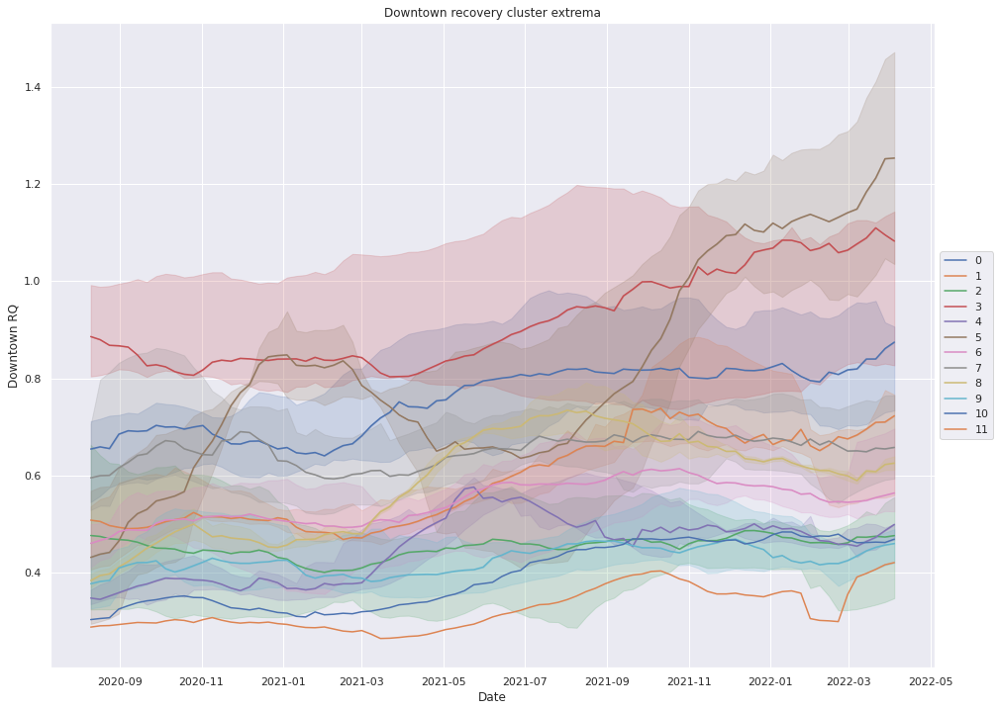

In [0]:
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(rq_dwtn_clusters['city'], rq_dwtn_clusters['cluster']))).astype(int)
#mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"]).dt.date
normalized_visits_dwtn = normalized_visits_dwtn.dropna()
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn["week"]>datetime.date(2020, 6, 1)]
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.sort_values(by = 'week').groupby(['city'])['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=19).mean().shift(-9))
normalized_visits_dwtn = normalized_visits_dwtn.dropna()

# compute the min, median and max
grouped = normalized_visits_dwtn.groupby(["cluster", "week"]).agg({'rolling': ['min', 'median', 'max']}).unstack("cluster")
grouped = grouped.dropna()

# plot medians
ax = grouped.loc[:,('rolling', 'median')].plot(figsize = (16, 12), sharey = True)

# Getting the color palette used
palette = sns.color_palette()

# index is now the number of clusters and indexes into grouped by cluster #
index = 0
for index in np.arange(0, len(normalized_visits_dwtn['cluster'].unique())):
        if index < 10: 
            ax.fill_between(grouped.index, grouped.loc[:,('rolling', 'median', index)], 
                    grouped.loc[:,('rolling', 'max', index)], alpha=.2, color=palette[index])
            ax.fill_between(grouped.index, 
                    grouped.loc[:,('rolling', 'min', index)] , grouped.loc[:,('rolling', 'median', index)], alpha=.2, color=palette[index])
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Downtown recovery cluster extrema')
plt.show()

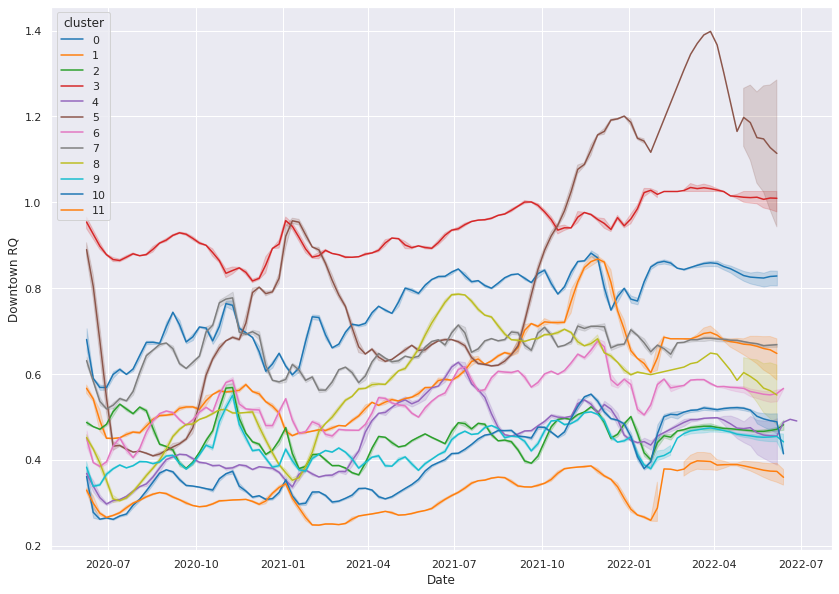

In [0]:
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(rq_dwtn_clusters['city'], rq_dwtn_clusters['cluster']))).astype(int)
mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=19).mean().shift(-9))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=mean_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10')
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
plt.show()

In [0]:
normalized_visits_dwtn[normalized_visits_dwtn["week"]==datetime.date(2020,12,7)]

Out[124]:

,city,metric,normalized_visits_by_total_visits,week,cluster,rolling
6006,Calgary,downtown,0.39,2020-12-07,9,0.415789
6007,Ottawa,downtown,0.37,2020-12-07,9,0.364737
6008,Edmonton,downtown,0.40,2020-12-07,2,0.423684
6010,Winnipeg,downtown,0.38,2020-12-07,2,0.431053
6011,Vancouver,downtown,0.42,2020-12-07,9,0.419474
...,...,...,...,...,...,...
6067,Atlanta,downtown,0.29,2020-12-07,10,0.320526
6068,Omaha,downtown,0.55,2020-12-07,0,0.664737
6069,Colorado Springs,downtown,0.56,2020-12-07,0,0.677895
6070,Raleigh,downtown,0.46,2020-12-07,9,0.519474


In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"]).dt.date
normalized_visits_dwtn.week.unique()

Out[121]: array([datetime.date(2022, 2, 14), datetime.date(2022, 2, 21),
 datetime.date(2022, 2, 28), datetime.date(2022, 3, 7),
 datetime.date(2022, 3, 14), datetime.date(2022, 3, 21),
 datetime.date(2022, 3, 28), datetime.date(2022, 4, 4),
 datetime.date(2022, 4, 11), datetime.date(2022, 4, 18),
 datetime.date(2022, 4, 25), datetime.date(2022, 5, 2),
 datetime.date(2022, 5, 9), datetime.date(2022, 5, 16),
 datetime.date(2022, 5, 23), datetime.date(2022, 5, 30),
 datetime.date(2022, 6, 6), datetime.date(2022, 6, 13),
 datetime.date(2022, 1, 31), datetime.date(2022, 2, 7),
 datetime.date(2022, 6, 20), datetime.date(2022, 6, 27),
 datetime.date(2020, 2, 24), datetime.date(2020, 3, 2),
 datetime.date(2020, 3, 9), datetime.date(2020, 3, 16),
 datetime.date(2020, 3, 23), datetime.date(2020, 3, 30),
 datetime.date(2020, 4, 6), datetime.date(2020, 4, 13),
 datetime.date(2020, 4, 20), datetime.date(2020, 4, 27),
 datetime.date(2020, 5, 4), datetime.date(2020, 5, 11),
 datetime.date(2020, 5, 18), datetime.date(2020, 5, 25),
 datetime.date(2020, 6, 1), datetime.date(2020, 6, 8),
 datetime.date(2020, 6, 15), datetime.date(2020, 6, 22),
 datetime.date(2020, 6, 29), datetime.date(2020, 7, 6),
 datetime.date(2020, 7, 13), datetime.date(2020, 7, 20),
 datetime.date(2020, 7, 27), datetime.date(2020, 8, 3),
 datetime.date(2020, 8, 10), datetime.date(2020, 8, 17),
 datetime.date(2020, 8, 24), datetime.date(2020, 8, 31),
 datetime.date(2020, 9, 7), datetime.date(2020, 9, 14),
 datetime.date(2020, 9, 21), datetime.date(2020, 9, 28),
 datetime.date(2020, 10, 5), datetime.date(2020, 10, 12),
 datetime.date(2020, 10, 19), datetime.date(2020, 10, 26),
 datetime.date(2020, 11, 2), datetime.date(2020, 11, 9),
 datetime.date(2020, 11, 16), datetime.date(2020, 11, 23),
 datetime.date(2020, 11, 30), datetime.date(2020, 12, 7),
 datetime.date(2020, 12, 14), datetime.date(2020, 12, 21),
 datetime.date(2020, 12, 28), datetime.date(2021, 1, 4),
 datetime.date(2021, 1, 11), datetime.date(2021, 1, 18),
 datetime.date(2021, 1, 25), datetime.date(2021, 2, 1),
 datetime.date(2021, 2, 8), datetime.date(2021, 2, 15),
 datetime.date(2021, 2, 22), datetime.date(2021, 3, 1),
 datetime.date(2021, 3, 8), datetime.date(2021, 3, 15),
 datetime.date(2021, 3, 22), datetime.date(2021, 3, 29),
 datetime.date(2021, 4, 5), datetime.date(2021, 4, 12),
 datetime.date(2021, 4, 19), datetime.date(2021, 4, 26),
 datetime.date(2021, 5, 3), datetime.date(2021, 5, 10),
 datetime.date(2021, 5, 17), datetime.date(2021, 5, 24),
 datetime.date(2021, 5, 31), datetime.date(2021, 6, 7),
 datetime.date(2021, 6, 14), datetime.date(2021, 6, 21),
 datetime.date(2021, 6, 28), datetime.date(2021, 7, 5),
 datetime.date(2021, 7, 12), datetime.date(2021, 7, 19),
 datetime.date(2021, 7, 26), datetime.date(2021, 8, 2),
 datetime.date(2021, 8, 9), datetime.date(2021, 8, 16),
 datetime.date(2021, 8, 23), datetime.date(2021, 8, 30),
 datetime.date(2021, 9, 6), datetime.date(2021, 9, 13),
 datetime.date(2021, 9, 20), datetime.date(2021, 9, 27),
 datetime.date(2021, 10, 4), datetime.date(2021, 10, 11),
 datetime.date(2021, 10, 18), datetime.date(2021, 10, 25),
 datetime.date(2021, 11, 1), datetime.date(2021, 11, 8),
 datetime.date(2021, 11, 15), datetime.date(2021, 11, 22),
 datetime.date(2021, 11, 29), datetime.date(2021, 12, 6),
 datetime.date(2021, 12, 13), datetime.date(2021, 12, 20),
 datetime.date(2021, 12, 27), datetime.date(2022, 1, 3),
 datetime.date(2022, 1, 10), datetime.date(2022, 1, 17),
 datetime.date(2022, 1, 24)], dtype=object)

In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=5).mean().shift(-3))
normalized_visits_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
#mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
#mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
#mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
#mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10')
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
plt.show()

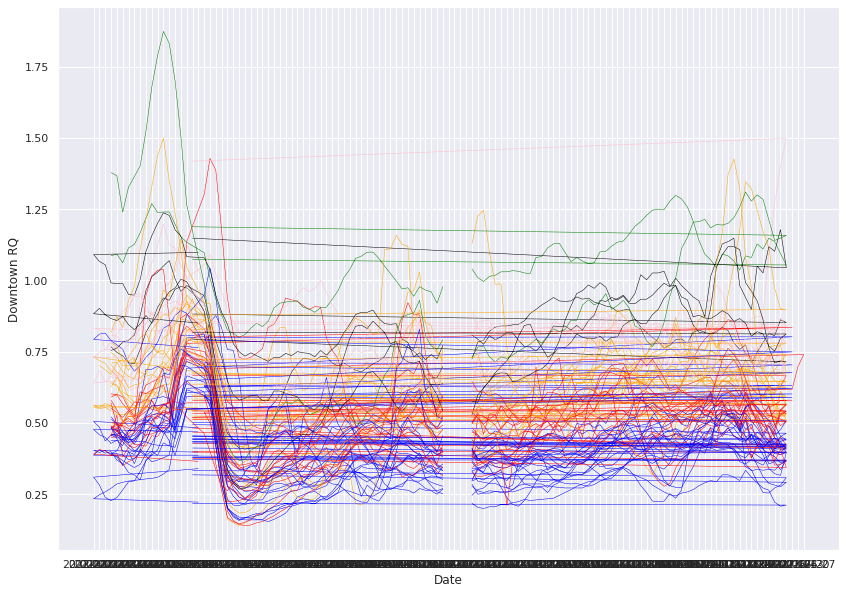

In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=5).mean().shift(-3))
#normalized_visits_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
normalized_visits_dwtn["color"] = normalized_visits_dwtn["cluster"].map({0:'blue', 1:'green',2:'orange',3:'red',4:'pink',5:'black'})
sns.set(rc={'figure.figsize':(14,10)})
for city in normalized_visits_dwtn['city'].unique():
    city_data = normalized_visits_dwtn[normalized_visits_dwtn['city']==city]
    ax = plt.plot(city_data['week'], city_data['rolling'], color=city_data['color'].iloc[0], linewidth=0.5)
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
plt.show()

In [0]:
import seaborn as sns

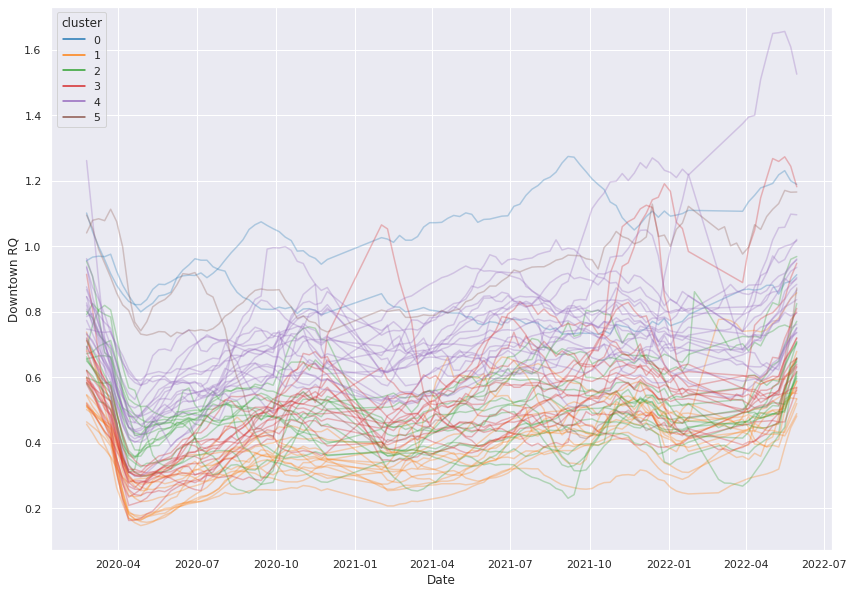

In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_1015_period_1').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('metrics_1015').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"].values)
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.3, estimator=None)#, ci='sd')
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
plt.show()

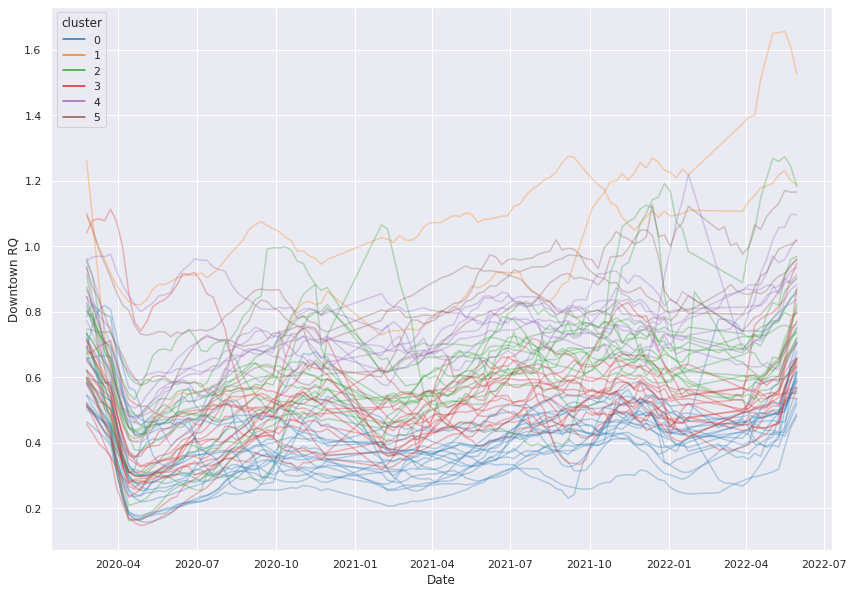

In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('metrics_1015').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"].values)
#mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
#mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
#mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
#mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.3, estimator=None)#, ci='sd')
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
plt.show()

In [0]:
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df')[['city','metric','normalized_visits_by_total_visits','week']].replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits["city"].isin(['Dallas','Orlando','Mississauga','Hamilton','Oklahoma City'])].copy()
normalized_visits_lq = normalized_visits[normalized_visits["metric"]=="relative"].copy()
normalized_visits_lq['cluster'] = normalized_visits_city['city'].map(dict(zip(rq_city_clusters['city'], rq_city_clusters['cluster']))).astype(int)

In [0]:
import seaborn as sns
sns.set_style("whitegrid")

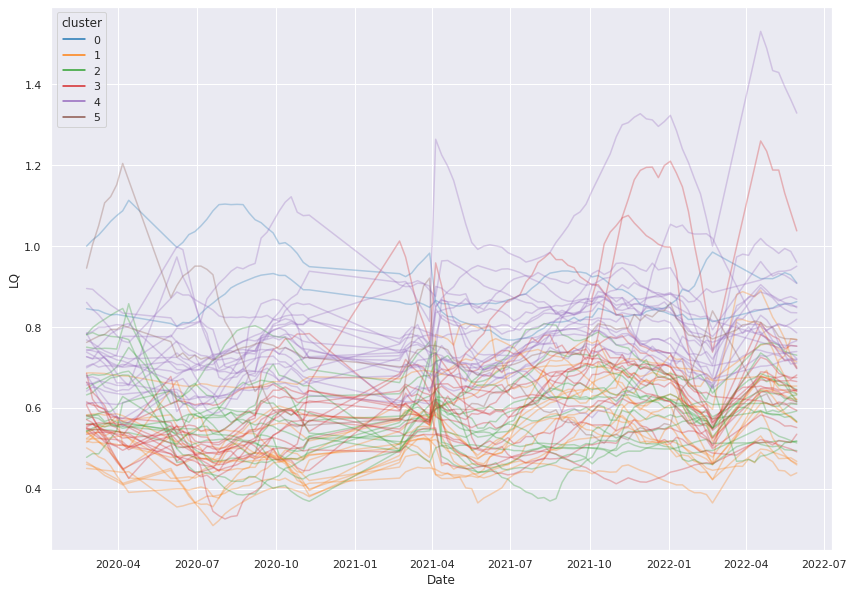

In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_1').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="relative"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=15).mean().shift(-7))
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"].values)
#mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
#mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
#mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
#mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.3, estimator=None)#, ci='sd')
plt.ylabel('LQ')
plt.xlabel('Date')
plt.show()

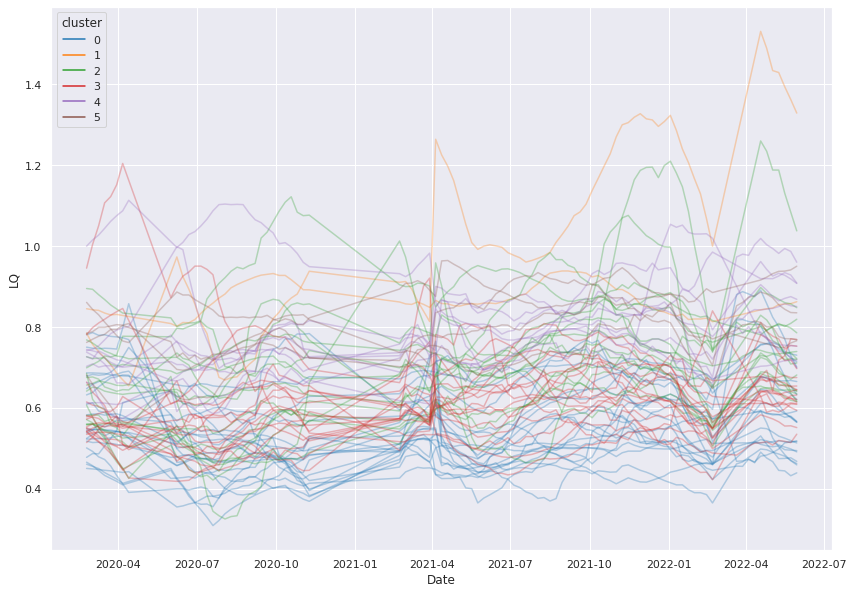

In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="relative"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=15).mean().shift(-7))
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"].values)
#mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
#mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
#mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
#mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.3, estimator=None)#, ci='sd')
plt.ylabel('LQ')
plt.xlabel('Date')
plt.show()

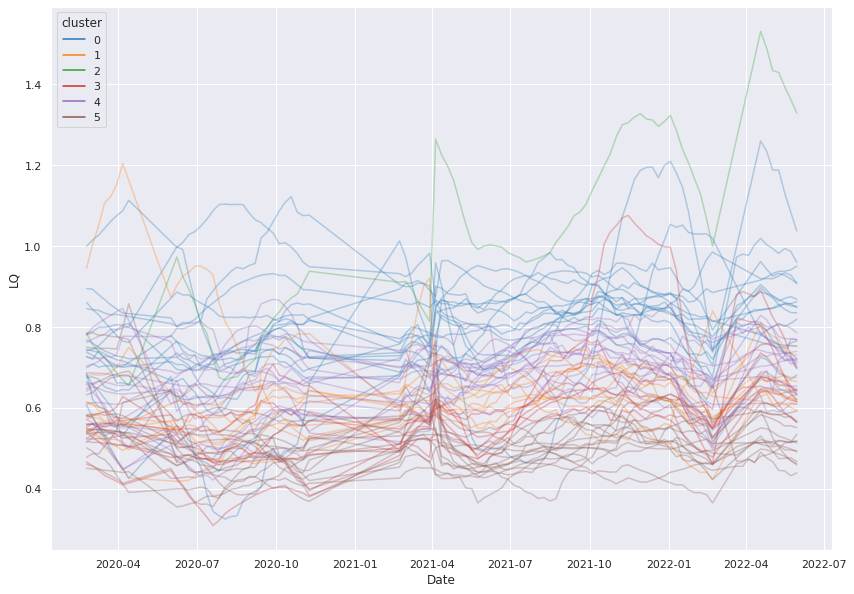

In [0]:
clusters = get_table_as_pandas_df('lq_clusters_0824_period_2_new').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="relative"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=15).mean().shift(-7))
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"].values)
#mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
#mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
#mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
#mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.3, estimator=None)#, ci='sd')
plt.ylabel('LQ')
plt.xlabel('Date')
plt.show()

In [0]:
display(get_table_as_pandas_df('lq_clusters_single_period_4'))

city,cluster
Fort Worth,2
New Orleans,2
Cincinnati,2
San Francisco,3
Detroit,3
Minneapolis,3
New York,3
Chicago,3
Boston,2
San Antonio,2


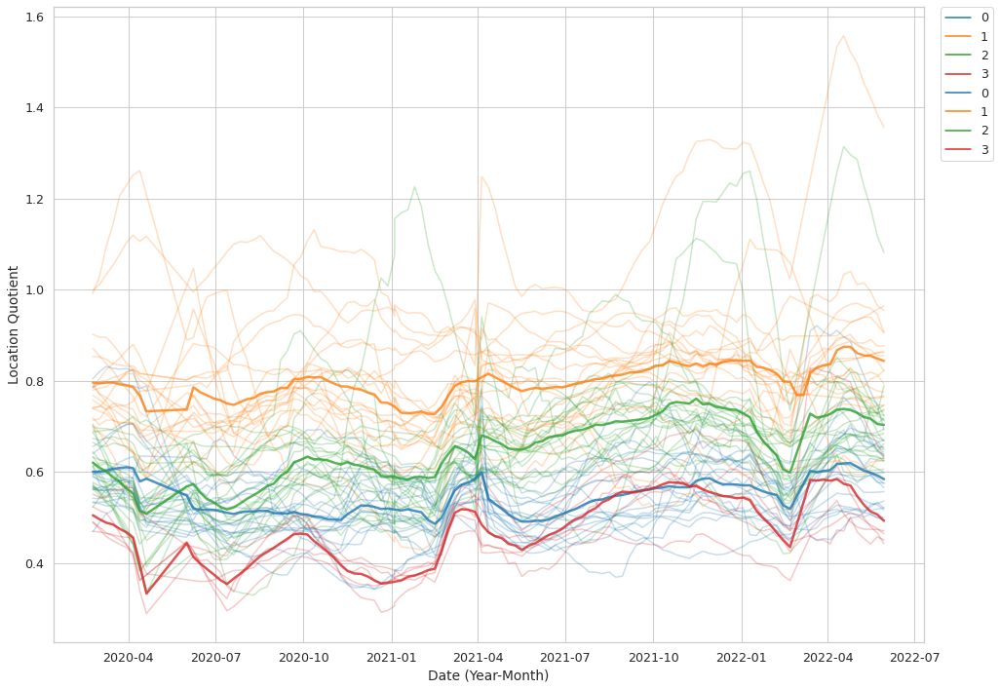

In [0]:
sns.set_theme(style="whitegrid")
clusters = get_table_as_pandas_df('lq_clusters_single_period_4').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="relative"].copy()
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn["normalized_visits_by_total_visits"].notna()]
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=13).mean().shift(-6))
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
#normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']>'2020-11-01']
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"])
normalized_visits_dwtn_avg = normalized_visits_dwtn.groupby(['week','cluster']).mean()['rolling'].reset_index()
sns.set(rc={'figure.figsize':(16,12)})
sns.set(font_scale = 1.15)
sns.set_style("whitegrid")
sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.25, estimator=None, linewidth=1.5)#, ci='sd')
sns.lineplot(data=normalized_visits_dwtn_avg, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='cluster', alpha=0.8, estimator=None, linewidth=2.5)#, ci='sd')
plt.ylabel('Location Quotient')
plt.xlabel('Date (Year-Month)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

In [0]:
display(get_table_as_pandas_df('rq_dwtn_clusters_0823_period_1'))

city,cluster
London,3
Houston,3
Indianapolis,3
Nashville,3
San Diego,4
Tucson,4
Salt Lake City,4
Washington DC,4
Fort Worth,4
El Paso,4


In [0]:
import seaborn as sns

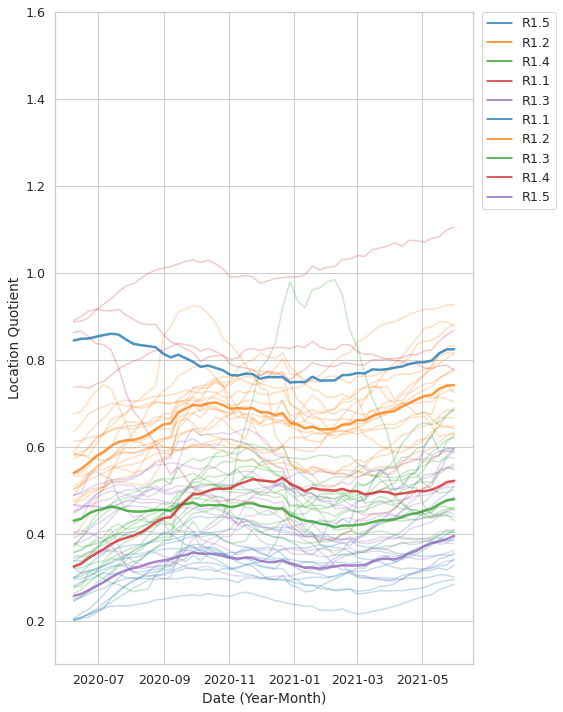

In [0]:
sns.set_theme(style="whitegrid")
clusters = get_table_as_pandas_df('rq_dwtn_clusters_1015_period_1').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('metrics_1015').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn["normalized_visits_by_total_visits"].notna()]
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=15).mean().shift(-7))
#normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['cluster'].map({0:0,1:1,2:2,3:3,4:4,5:0})
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['cluster'].map({0:"R1.1",1:"R1.5",2:"R1.3",3:"R1.4",4:"R1.2",5:"R1.1"})
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']>'2020-06-01']
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2021-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"])
normalized_visits_dwtn_avg = normalized_visits_dwtn.groupby(['week','cluster']).mean()['rolling'].reset_index()
sns.set(rc={'figure.figsize':(7.5,12)})
sns.set(font_scale = 1.15)
sns.set_style("whitegrid")
sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.25, estimator=None, linewidth=1.5)#, ci='sd')
sns.lineplot(data=normalized_visits_dwtn_avg, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='cluster', alpha=0.8, estimator=None, linewidth=2.5)#, ci='sd')
plt.ylabel('Location Quotient')
plt.xlabel('Date (Year-Month)')
plt.ylim(0.1,1.6)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

In [0]:
display(get_table_as_pandas_df('rq_dwtn_clusters_1015_period_2'))

city,cluster
San Antonio,0
Cincinnati,0
Los Angeles,0
Nashville,0
Tucson,0
Memphis,0
Washington DC,0
Phoenix,0
Denver,4
Winnipeg,4


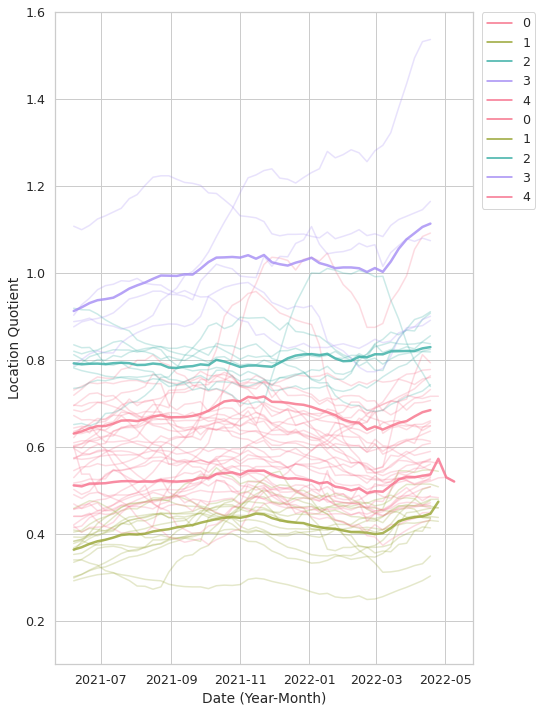

In [0]:
sns.set_theme(style="whitegrid")
clusters = get_table_as_pandas_df('rq_dwtn_clusters_1015_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('metrics_1015').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn["normalized_visits_by_total_visits"].notna()]
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"])
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=15).mean().shift(-7))
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['cluster'].map({0:0,1:1,2:2,3:3,4:4,5:3})
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']>'2021-06-01']
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-05-15']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"])
normalized_visits_dwtn_avg = normalized_visits_dwtn.groupby(['week','cluster']).mean()['rolling'].reset_index()
sns.set(rc={'figure.figsize':(7.5,12)})
sns.set(font_scale = 1.15)
sns.set_style("whitegrid")
sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='husl', units='city', alpha=0.25, estimator=None, linewidth=1.5)#, ci='sd')
sns.lineplot(data=normalized_visits_dwtn_avg, x ='week', y = 'rolling', hue='cluster', palette='husl', units='cluster', alpha=0.8, estimator=None, linewidth=2.5)#, ci='sd')

plt.ylabel('Location Quotient')
plt.xlabel('Date (Year-Month)')
plt.ylim(0.1,1.6)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

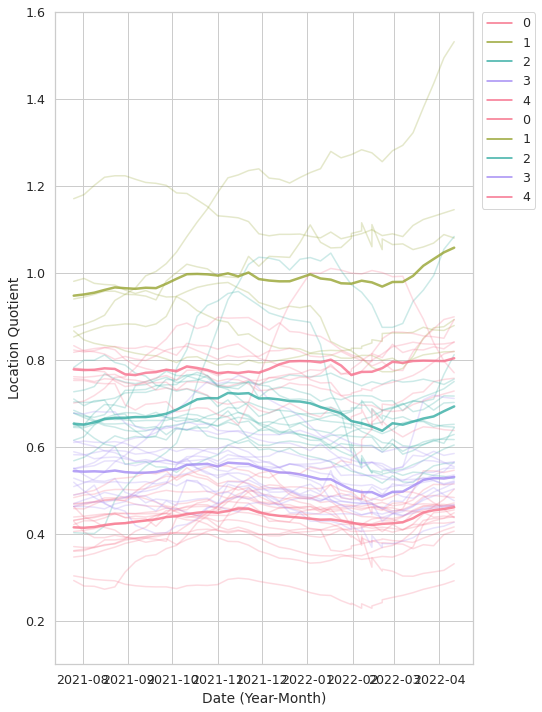

In [0]:
sns.set_theme(style="whitegrid")
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn = normalized_visits_dwtn[~normalized_visits_dwtn["normalized_visits_by_total_visits"].isna()]
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']>'2021-06-01']
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2022-05-31']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"])
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn['normalized_visits_by_total_visits'] = normalized_visits_dwtn['normalized_visits_by_total_visits'].astype(float)
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=15).mean().shift(-7))
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['cluster'].map({0:0,1:1,2:2,3:3,4:4,5:1})
normalized_visits_dwtn_avg = normalized_visits_dwtn.groupby(['week','cluster']).mean()['rolling'].reset_index()
sns.set(rc={'figure.figsize':(7.5,12)})
sns.set(font_scale = 1.15)
sns.set_style("whitegrid")
sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='husl', units='city', alpha=0.25, estimator=None, linewidth=1.5)#, ci='sd')
sns.lineplot(data=normalized_visits_dwtn_avg, x ='week', y = 'rolling', hue='cluster', palette='husl', units='cluster', alpha=0.8, estimator=None, linewidth=2.5)#, ci='sd')
plt.ylabel('Location Quotient')
plt.xlabel('Date (Year-Month)')
plt.ylim(0.1,1.6)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

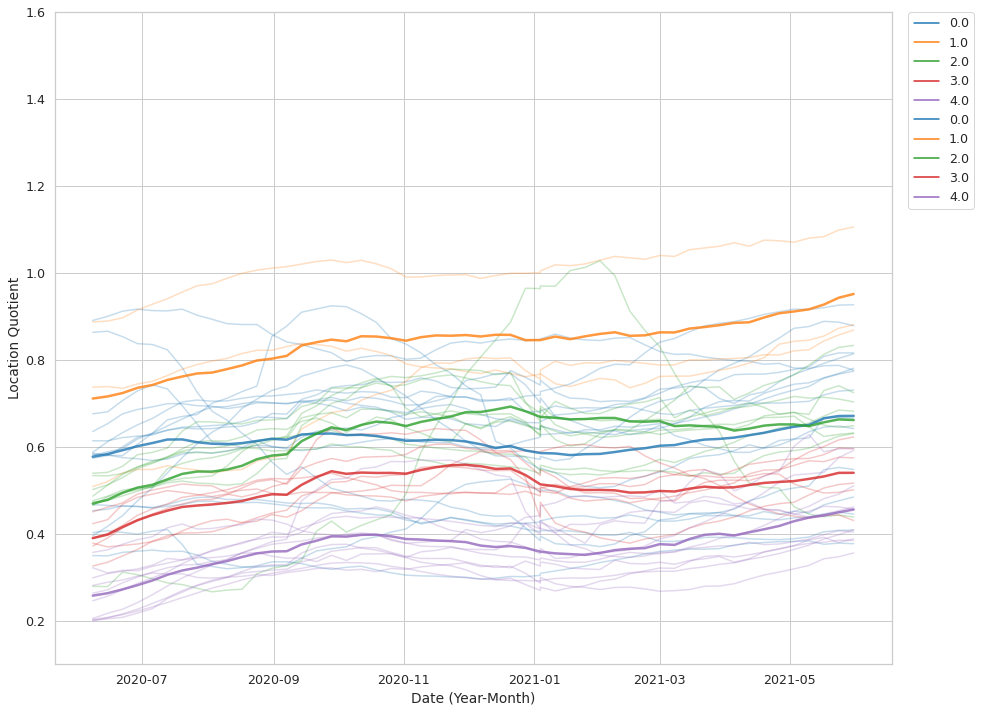

In [0]:
import seaborn as sns
sns.set_theme(style="whitegrid")
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0831_all_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = get_table_as_pandas_df('0714_combined_metrics_df').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits = normalized_visits[~normalized_visits['city'].isin(['Orlando','Dallas','Hamilton','Mississauga','Oklahoma City'])]
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn["normalized_visits_by_total_visits"].notna()]
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
normalized_visits_dwtn = normalized_visits_dwtn.sort_values(by='week')
normalized_visits_dwtn['rolling'] = normalized_visits_dwtn.groupby('city')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=15).mean().shift(-7))
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['cluster'].map({0:0,1:1,2:2,3:3,4:4,5:0})
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']>'2020-06-01']
normalized_visits_dwtn = normalized_visits_dwtn[normalized_visits_dwtn['week']<'2021-06-01']
normalized_visits_dwtn["week"] = pd.to_datetime(normalized_visits_dwtn["week"])
normalized_visits_dwtn_avg = normalized_visits_dwtn.groupby(['week','cluster']).mean()['rolling'].reset_index()
sns.set(rc={'figure.figsize':(15,12)})
sns.set(font_scale = 1.15)
sns.set_style("whitegrid")
sns.lineplot(data=normalized_visits_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='city', alpha=0.25, estimator=None, linewidth=1.5)#, ci='sd')
sns.lineplot(data=normalized_visits_dwtn_avg, x ='week', y = 'rolling', hue='cluster', palette='tab10', units='cluster', alpha=0.8, estimator=None, linewidth=2.5)#, ci='sd')
plt.ylabel('Location Quotient')
plt.xlabel('Date (Year-Month)')
plt.ylim(0.1,1.6)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

In [0]:
display(normalized_visits_dwtn)

In [0]:
normalized_visits_dwtn.groupby(['week','cluster']).mean()['rolling'].reset_index()

Out[64]:

,week,cluster,rolling
0,2020-02-24,0,0.583685
1,2020-02-24,1,0.782386
2,2020-02-24,2,0.602400
3,2020-02-24,3,0.480800
4,2020-03-02,0,0.586537
...,...,...,...
471,2022-05-23,3,0.500699
472,2022-05-30,0,0.577288
473,2022-05-30,1,0.837868
474,2022-05-30,2,0.697576


In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_1').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=mean_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10')
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
plt.show()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-1001567843082303> in <module> 
 4 mean_dwtn = normalized_visits_dwtn . groupby ( [ 'cluster' , 'week' ] ) . mean ( ) [ 'normalized_visits_by_total_visits' ] . reset_index ( ) 
 5 mean_dwtn [ "week" ] = pd . to_datetime ( mean_dwtn [ "week" ] ) . dt . date
 ----> 6 mean_dwtn = mean_dwtn [ mean_dwtn [ "week" ] > datetime . date ( 2020 , 6 , 1 ) ] 
 7 mean_dwtn [ 'rolling' ] = mean_dwtn . groupby ( 'cluster' ) [ 'normalized_visits_by_total_visits' ] . transform ( lambda x : x . rolling ( window = 9 ) . mean ( ) . shift ( - 4 ) ) 
 8 sns . set ( rc = { 'figure.figsize' : ( 14 , 10 ) } ) 

 NameError : name 'datetime' is not defined

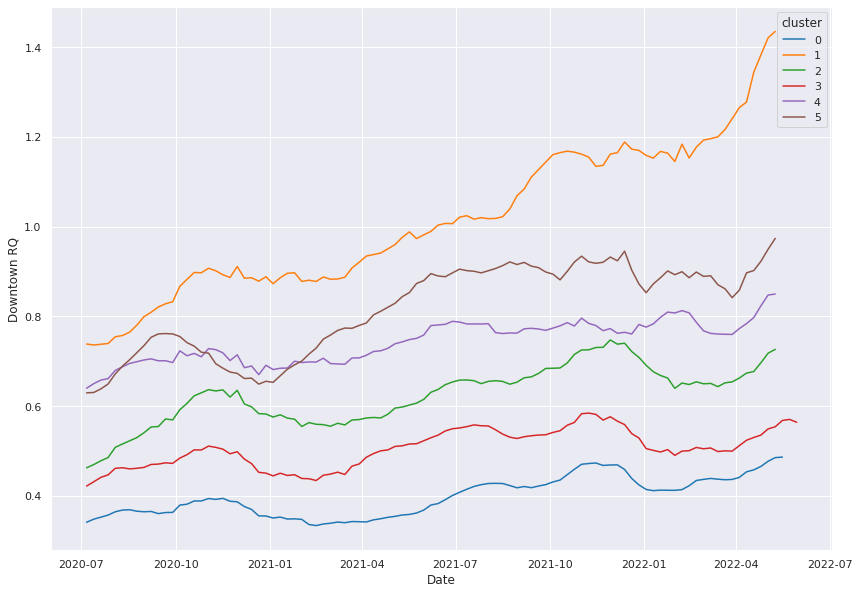

In [0]:
clusters = get_table_as_pandas_df('rq_dwtn_clusters_0823_period_2').replace('Montréal','Montreal').replace('Québec','Quebec')
normalized_visits_dwtn = normalized_visits[normalized_visits["metric"]=="downtown"].copy()
normalized_visits_dwtn['cluster'] = normalized_visits_dwtn['city'].map(dict(zip(clusters['city'], clusters['cluster']))).astype(int)
mean_dwtn = normalized_visits_dwtn.groupby(['cluster','week']).mean()['normalized_visits_by_total_visits'].reset_index()
mean_dwtn["week"] = pd.to_datetime(mean_dwtn["week"]).dt.date
mean_dwtn = mean_dwtn[mean_dwtn["week"]>datetime.date(2020, 6, 1)]
mean_dwtn['rolling'] = mean_dwtn.groupby('cluster')['normalized_visits_by_total_visits'].transform(lambda x : x.rolling(window=9).mean().shift(-4))
sns.set(rc={'figure.figsize':(14,10)})
ax = sns.lineplot(data=mean_dwtn, x ='week', y = 'rolling', hue='cluster', palette='tab10')
plt.ylabel('Downtown RQ')
plt.xlabel('Date')
plt.show()